
A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "d:\anaconda3\Lib\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "d:\anaconda3\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "d:\anaconda3\Lib\site-packages\ipykernel\kernelapp.py", line 739, in start
    self.io_loop.start()
  File "d:\anaconda3\Lib\site-packages\tornado\platform\asyncio.py", line 211, in 

AttributeError: _ARRAY_API not found

输出文件夹: F:\Desktop\CAMPF_Supplementary\data\3-1-(3-2)Sorted_L2_Policy_Clustering_pic

开始生成 15 个L2政策的聚类Trend图...
[1/15] 处理: Buildings – market-based instruments
已保存: Buildings – market-based instruments_Sorted_Trend.png
[2/15] 处理: Buildings – non market-based instruments
已保存: Buildings – non market-based instruments_Sorted_Trend.png
[3/15] 处理: Climate governance
已保存: Climate governance_Sorted_Trend.png
[4/15] 处理: Electricity – market-based instruments
已保存: Electricity – market-based instruments_Sorted_Trend.png
[5/15] 处理: Electricity – non market-based instruments
已保存: Electricity – non market-based instruments_Sorted_Trend.png
[6/15] 处理: Fossil fuel production policies
已保存: Fossil fuel production policies_Sorted_Trend.png
[7/15] 处理: GHG emissions data and reporting
已保存: GHG emissions data and reporting_Sorted_Trend.png
[8/15] 处理: GHG emissions targets
已保存: GHG emissions targets_Sorted_Trend.png
[9/15] 处理: Industry – market-based instruments
已保存: Industry – market-based instruments_Sorte

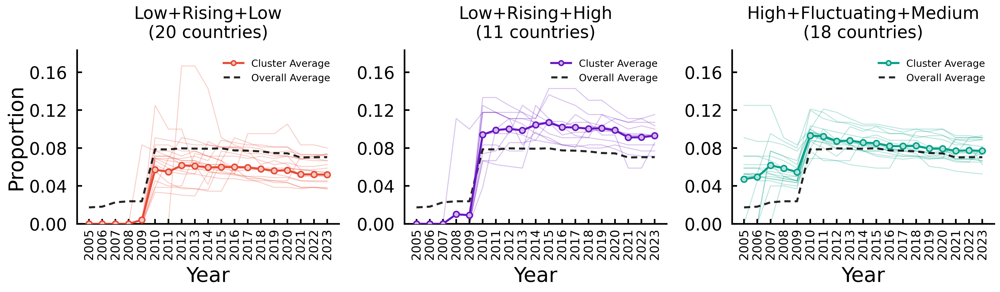

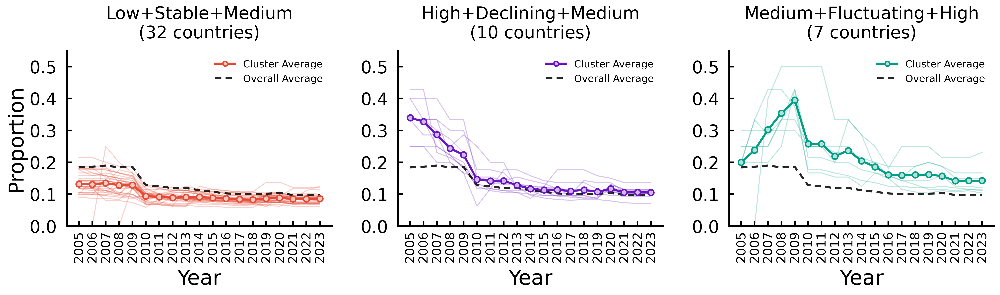

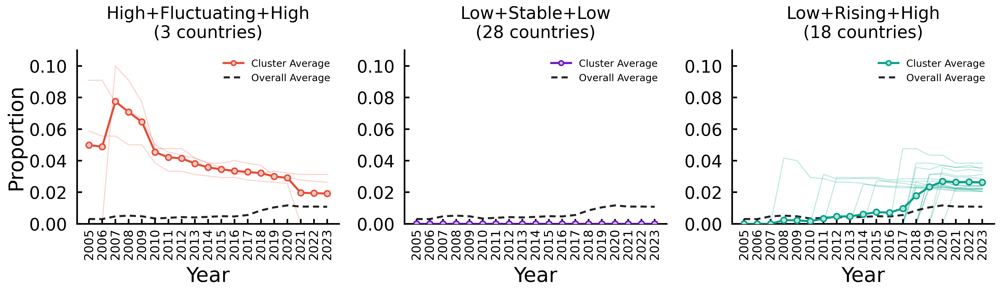

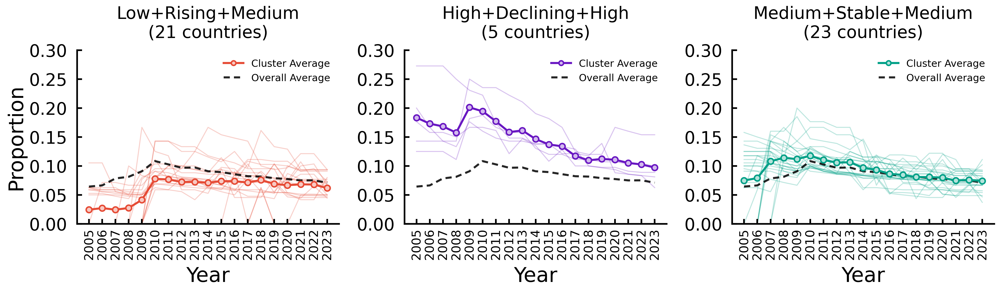

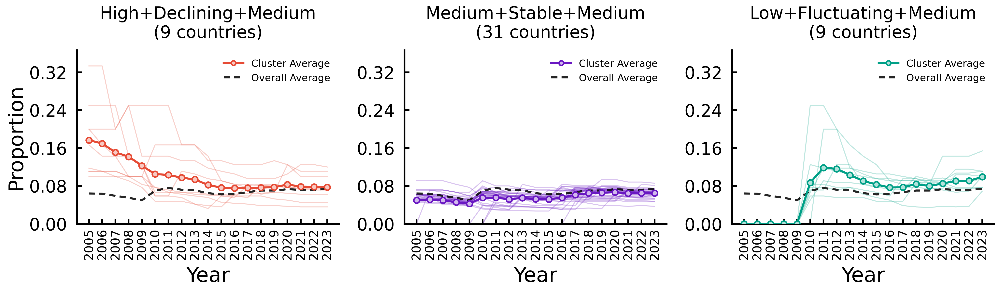

...

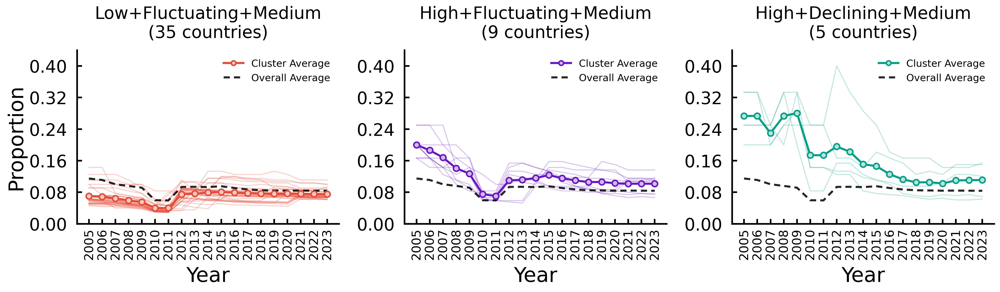

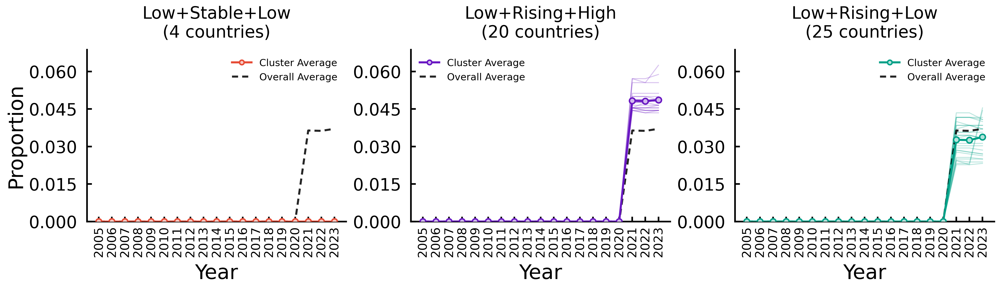

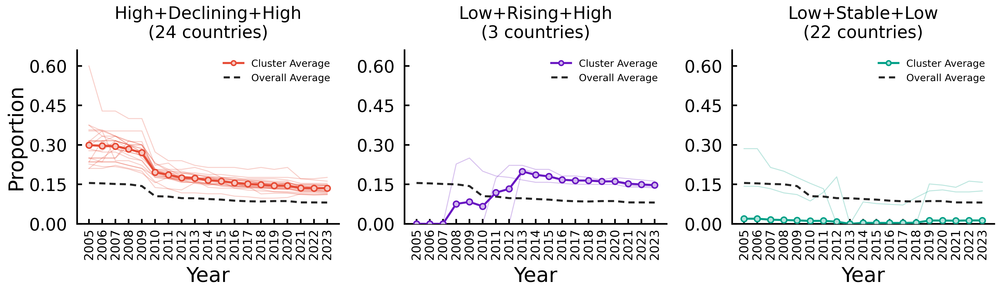

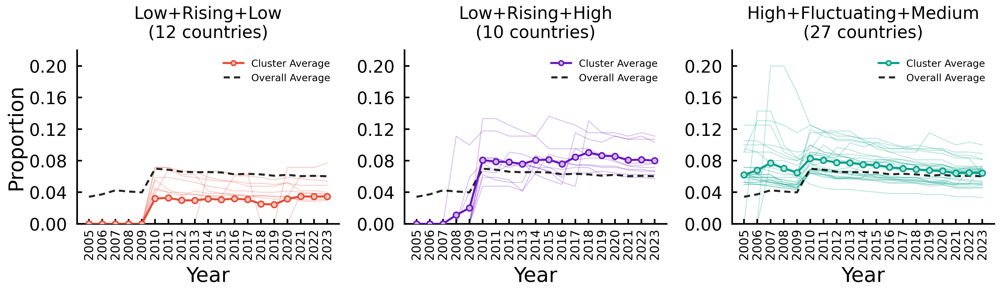

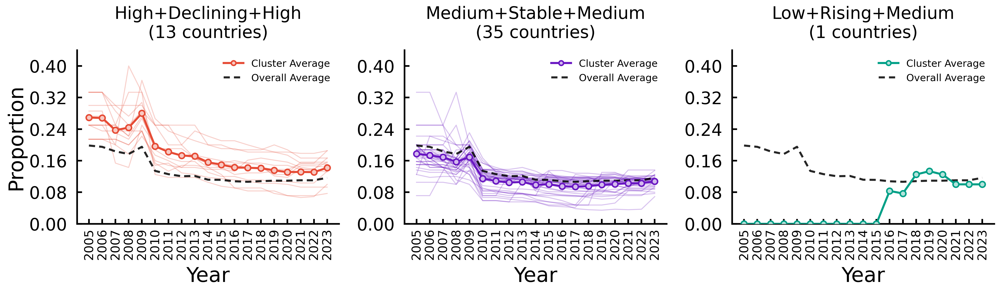

In [1]:
import pandas as pd      
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import MaxNLocator, MultipleLocator
from pathlib import Path
import os
from general_pic_setup import setup_mpl_single2
import matplotlib as mpl


# 基础样式
setup_mpl_single2()
mpl.rcParams['axes.titlesize'] = 'small'

# Nature 风格配色
nature_colors = [
    '#E64B35', "#6917C2", '#00A087', '#3C5488',
    '#F39B7F', '#8491B4', '#91D1C2', '#DC0000',
    '#7E6148', '#B09C85', '#E18727', '#20854E',
    '#0072B5', '#BC3C29', '#6F99AD',
]

def lighten_color(color, amount=0.7):
    """将颜色变得更浅，用于圆圈填充"""
    try:
        c = mcolors.to_rgb(color)
        c = tuple([c[i] + (1 - c[i]) * amount for i in range(3)])
        return c
    except Exception:
        return color


def load_existing_cluster_data(data_dir):
    """加载已有的聚类结果和排序规则"""
    cluster_assignment_path = data_dir / "3-1-L2_Policy_Clustering_pic/3-1_cluster_assignment_table.csv"
    cluster_df = pd.read_csv(cluster_assignment_path, index_col=0, encoding='utf-8-sig')
    
    cluster_detail_path = data_dir / "3-1-L2_Policy_Clustering_countries.csv"
    detail_df = pd.read_csv(cluster_detail_path, encoding='utf-8-sig')
    
    sort_rule_path = data_dir / "3-2-Human_Recognition_Mode_Countries.csv"
    sort_df = pd.read_csv(sort_rule_path, encoding='utf-8-sig')
    
    return cluster_df, detail_df, sort_df


def create_sort_priority(sort_df):
    """
    创建排序优先级
    优先级：Starting(低→中→高) > Ending(Low Share→Medium Share→High Share) > Trend(Rising→Stable→Fluctuating→Declining)
    """
    start_order = {'Low': 0, 'Medium': 1, 'High': 2}
    end_order = {'Low Share': 0, 'Medium Share': 1, 'High Share': 2}
    trend_order = {'Rising': 0, 'Stable': 1, 'Fluctuating': 2, 'Declining': 3}
    
    sort_df['sort_key'] = sort_df.apply(
        lambda row: (
            start_order.get(row['Starting'], 99),
            end_order.get(row['Ending'], 99),
            trend_order.get(row['Trend'], 99),
            row['国家']
        ), 
        axis=1
    )
    
    sort_df_sorted = sort_df.sort_values(['L2政策中文名', 'sort_key'])
    
    l2_country_order = {}
    for l2 in sort_df_sorted['L2政策中文名'].unique():
        countries = sort_df_sorted[sort_df_sorted['L2政策中文名'] == l2]['国家'].tolist()
        l2_country_order[l2] = countries
    
    return sort_df_sorted, l2_country_order


def generate_descriptive_title(sort_df, l2_policy, cluster_id):
    """生成描述性标题：Starting+Trend+Ending"""
    cluster_data = sort_df[
        (sort_df['L2政策中文名'] == l2_policy) & 
        (sort_df['聚类ID'] == cluster_id)
    ]
    
    if cluster_data.empty:
        return f"Cluster {cluster_id}"
    
    start_mode = cluster_data['Starting'].mode()[0] if not cluster_data['Starting'].mode().empty else 'Unknown'
    trend_mode = cluster_data['Trend'].mode()[0] if not cluster_data['Trend'].mode().empty else 'Unknown'
    end_mode = cluster_data['Ending'].mode()[0] if not cluster_data['Ending'].mode().empty else 'Unknown'
    
    end_mode_display = end_mode.replace(' Share', '')
    return f"{start_mode}+{trend_mode}+{end_mode_display}"


def load_country_time_series(detail_df, l2_policy):
    """从详细数据中加载指定L2政策的时间序列数据"""
    l2_data = detail_df[detail_df['L2政策中文名'] == l2_policy].copy()
    
    country_matrices = {}
    for country in l2_data['国家'].unique():
        country_data = l2_data[l2_data['国家'] == country].sort_values('年份')
        series = pd.Series(
            country_data['占比'].values,
            index=country_data['年份'].values
        )
        country_matrices[country] = series
    
    return country_matrices, sorted(l2_data['年份'].unique())


def plot_sorted_trends(l2_policy, cluster_df, detail_df, sort_df, 
                       l2_country_order, output_folder):
    """绘制按排序规则重新组织的Trend图 - 横排3列布局"""
    cluster_assignments = cluster_df.loc[l2_policy].to_dict()
    
    # 加载时间序列数据
    country_matrices, years = load_country_time_series(detail_df, l2_policy)
    
    sorted_countries = l2_country_order[l2_policy]
    
    # 按聚类分组（保持排序后的国家顺序）
    cluster_dict = {}
    for country in sorted_countries:
        if country in cluster_assignments:
            cid = cluster_assignments[country]
            if cid not in cluster_dict:
                cluster_dict[cid] = []
            cluster_dict[cid].append(country)
    
    n_clusters = len(cluster_dict)
    
    # 计算整体平均
    overall_avg = pd.Series(0.0, index=years)
    overall_cnt = pd.Series(0, index=years)
    for country in sorted_countries:
        if country in country_matrices:
            series = country_matrices[country]
            for y in years:
                if y in series.index:
                    overall_avg[y] += series[y]
                    overall_cnt[y] += 1
    overall_avg = overall_avg / overall_cnt.replace(0, np.nan)
    
    # 计算全局最大值用于统一y轴
    global_max = 0.0
    for series in country_matrices.values():
        for val in series.values:
            if not np.isnan(val):
                global_max = max(global_max, val)
    y_max = global_max * 1.1
    
    # 横排3列布局
    n_cols = 3
    n_rows = (n_clusters + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, 
                             figsize=(20, 3.5*n_rows),
                             squeeze=False)
    
    # 按聚类ID排序绘图
    for idx, cid in enumerate(sorted(cluster_dict.keys())):
        countries = cluster_dict[cid]
        
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        
        color = nature_colors[idx % len(nature_colors)]
        fill_color = lighten_color(color, amount=0.7)
        
        # 绘制各国曲线
        for country in countries:
            if country in country_matrices:
                series = country_matrices[country]
                ax.plot(years, [series.get(y, np.nan) for y in years], 
                       color=color, alpha=0.25, linewidth=1.2, zorder=1)
        
        # 计算并绘制聚类平均
        cluster_avg = pd.Series(0.0, index=years)
        cluster_cnt = pd.Series(0, index=years)
        for country in countries:
            if country in country_matrices:
                series = country_matrices[country]
                for y in years:
                    if y in series.index:
                        cluster_avg[y] += series[y]
                        cluster_cnt[y] += 1
        cluster_avg = cluster_avg / cluster_cnt.replace(0, np.nan)
        
        # 圆圈标记大小为7
        ax.plot(years, cluster_avg.values, 
                marker='o', color=color, 
                linewidth=2.5, markersize=7,
                markerfacecolor=fill_color, 
                markeredgecolor=color,
                markeredgewidth=1.8,
                label='Cluster Average',
                markevery=max(1, len(years)//10), 
                zorder=10)
        
        # 绘制整体平均线
        ax.plot(years, overall_avg.values, 
                color='#000000', linestyle='--', linewidth=2.5, 
                label='Overall Average', alpha=0.85, zorder=9,
                dashes=(3, 2))
        
        # 生成描述性标题，标题字号设置为28（比XY标签的25稍大）
        desc_title = generate_descriptive_title(sort_df, l2_policy, cid)
        
        ax.set_title(f'{desc_title}\n({len(countries)} countries)', 
                    pad=15, ha='center')
        ax.set_xlabel('Year', labelpad=8)
        
        # 只在最左列显示Proportion标签
        if col == 0:
            ax.set_ylabel('Proportion')
        else:
            ax.set_ylabel('')
        
        ax.set_ylim(0, y_max)
        
        ax.xaxis.set_major_locator(MultipleLocator(1))
        ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
        ax.tick_params(axis='x', rotation=90, labelsize=15, pad=5.5)
        ax.tick_params(axis='y')
        
        # 图例样式
        ax.legend(loc='best', frameon=False, fontsize=12,
                 handlelength=2.0, markerscale=0.8)
        
        # 隐藏顶部和右侧边框
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    
    # 隐藏多余子图
    for idx in range(n_clusters, n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis('off')
    
    # 调整子图间距
    plt.subplots_adjust(hspace=0.4, wspace=0.25, top=0.95)
    
    out_path = output_folder / f'{l2_policy}_Sorted_Trend.png'
    plt.savefig(out_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.close()
    
    print(f"已保存: {out_path.name}")


def display_cluster_plots_in_jupyter(output_folder, l2_categories, max_display=5):
    """在Jupyter中显示图表"""
    try:
        from IPython.display import display, Image, HTML
        
        trend_plots = []
        for l2 in l2_categories:
            plot_path = output_folder / f'{l2}_Sorted_Trend.png'
            if plot_path.exists():
                trend_plots.append((l2, plot_path))
        
        total = len(trend_plots)
        display_count = min(max_display, total)
        
        for idx, (l2, path) in enumerate(trend_plots[:display_count], 1):
            display(HTML(f"<h3 style='color: #457B9D;'>{idx}. {l2}</h3>"))
            display(Image(filename=str(path), width=1400))
            display(HTML("<hr style='border: 1px dashed #ccc; margin: 30px 0;'>"))
        
        if total > display_count:
            display(HTML(f"<p style='color: #666; font-style: italic;'>仅显示前 {display_count} 个，共 {total} 个图表</p>"))
    except ImportError:
        print("非Jupyter环境，跳过图表显示")


# 主程序
script_dir = Path(os.getcwd())
data_dir = script_dir.parent / "data"
output_folder = data_dir / "3-1-(3-2)Sorted_L2_Policy_Clustering_pic"
output_folder.mkdir(parents=True, exist_ok=True)

print(f"输出文件夹: {output_folder.resolve()}")

# 加载数据
cluster_df, detail_df, sort_df = load_existing_cluster_data(data_dir)

# 创建排序优先级
sort_df_sorted, l2_country_order = create_sort_priority(sort_df)

# 获取所有L2政策
l2_policies = cluster_df.index.tolist()

# 为每个L2政策生成图表
print(f"\n开始生成 {len(l2_policies)} 个L2政策的聚类Trend图...")
for idx, l2 in enumerate(l2_policies, 1):
    print(f"[{idx}/{len(l2_policies)}] 处理: {l2}")
    plot_sorted_trends(
        l2_policy=l2,
        cluster_df=cluster_df,
        detail_df=detail_df,
        sort_df=sort_df_sorted,
        l2_country_order=l2_country_order,
        output_folder=output_folder
    )

print(f"\n所有图表已保存到: {output_folder}")

# 在Jupyter中显示图表
display_cluster_plots_in_jupyter(output_folder, l2_policies, max_display=15)
